# Combined vs Single Run Comparison  
### Experiment: `TEST04272025_MULTISTUDY_EXP1`  
### Study ID: `2.25.3749579399667658302878752128209802123`

---

This notebook compares the results of a **combined multi-study DeepSight run** with those of **four single-study runs** for the same study ID.

We analyze:
- Study-level scores: **Total**, **L**, and **R**
- DICOM-level segmentation scores and consistency
- Final segmentation image outputs (for visual verification)

---

### Key Findings:

- The **Combined L score (0.3064)** is exactly the **average** of L scores from `single/01` (0.2325) and `single/04` (0.3802).
- **All DICOM-level scores are identical** between the combined and single runs.
- No discrepancies were found in scoring or segmentation output.

This validates the consistency of DeepSight output across both modes of analysis.


In [1]:
#Import Required Libraries
import os
import json



In [2]:
# Base directory for current test run
BASE_DIR = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT"

# Combined JSON
COMBINED_JSON = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/combined/combined/results_full.json"

# Single run JSONs
SINGLE_01 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single01.2/01/results_full.json"
SINGLE_02 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single02/02/results_full.json"
SINGLE_03 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single3/03/results_full.json"
SINGLE_04 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single4/04/results_full.json"


In [3]:
# Load combined run JSON
with open(COMBINED_JSON, "r") as f:
    combined_data = json.load(f)

print(" Combined JSON loaded")


 Combined JSON loaded


In [4]:
# Load all 4 single JSONs
with open(SINGLE_01, "r") as f: single_01 = json.load(f)
with open(SINGLE_02, "r") as f: single_02 = json.load(f)
with open(SINGLE_03, "r") as f: single_03 = json.load(f)
with open(SINGLE_04, "r") as f: single_04 = json.load(f)

# Group into a list
single_data = [single_01, single_02, single_03, single_04]
print(" Single JSONs loaded")


 Single JSONs loaded


In [5]:
# Combined scores
combined_total = combined_data["results"]["study_results"]["total"]["score"]
combined_L = combined_data["results"]["study_results"].get("L", {}).get("score")
combined_R = combined_data["results"]["study_results"].get("R", {}).get("score")

# Single scores from each subfolder
single_01_study = single_data[0]["results"]["study_results"]
single_02_study = single_data[1]["results"]["study_results"]
single_03_study = single_data[2]["results"]["study_results"]
single_04_study = single_data[3]["results"]["study_results"]

# Build rows
rows = [
    {"Run": "Combined", "Total": combined_total, "L": combined_L, "R": combined_R},
    {"Run": "single/01", "Total": single_01_study.get("total", {}).get("score"), "L": single_01_study.get("L", {}).get("score"), "R": single_01_study.get("R", {}).get("score")},
    {"Run": "single/02", "Total": single_02_study.get("total", {}).get("score"), "L": single_02_study.get("L", {}).get("score"), "R": single_02_study.get("R", {}).get("score")},
    {"Run": "single/03", "Total": single_03_study.get("total", {}).get("score"), "L": single_03_study.get("L", {}).get("score"), "R": single_03_study.get("R", {}).get("score")},
    {"Run": "single/04", "Total": single_04_study.get("total", {}).get("score"), "L": single_04_study.get("L", {}).get("score"), "R": single_04_study.get("R", {}).get("score")},
]

# Display as DataFrame
import pandas as pd
df_study_scores = pd.DataFrame(rows).round(4)
df_study_scores


,Run,Total,L,R
0,Combined,0.8122,0.3064,0.8122
1,single/01,0.2325,0.2325,NaN
2,single/02,0.7975,NaN,0.7975
3,single/03,0.8268,NaN,0.8268
4,single/04,0.3802,0.3802,NaN


In [6]:
# Extract Combined DICOM scores
combined_dicom = combined_data["results"]["dicom_results"]
rows = []

# Loop through each DICOM ID in combined
for dxm_id, results in combined_dicom.items():
    comb_score = max(d["score"] for d in results.get("none", []))
    
    # Look for match in single subfolders
    single_score = None
    matching_folder = None
    for i, entry in enumerate(single_data):
        dicom_results = entry["results"]["dicom_results"]
        if dxm_id in dicom_results:
            single_score = max(d["score"] for d in dicom_results[dxm_id].get("none", []))
            matching_folder = f"single/0{i+1}"
            break
    
    delta = comb_score - single_score if single_score is not None else None
    rows.append({
        "DICOM ID": dxm_id,
        "Combined Score": round(comb_score, 4),
        "Single Run": matching_folder,
        "Single Score": round(single_score, 4) if single_score else None,
        "Δ (Combined − Single)": round(delta, 4) if delta else None
    })

# Display table
df_dicom_comparison = pd.DataFrame(rows)
df_dicom_comparison


,DICOM ID,Combined Score,Single Run,Single Score,Δ (Combined − Single)
0,2.25.13615483182747171948811667937215230403,0.2325,single/01,0.2325,None
1,2.25.329990412155369124230309437689489894131,0.3802,single/04,0.3802,None
2,2.25.14639725768061252105362277030677280659,0.7975,single/02,0.7975,None
3,2.25.157890062129678755545288856243547559791,0.8268,single/03,0.8268,None


 Combined Result Image:


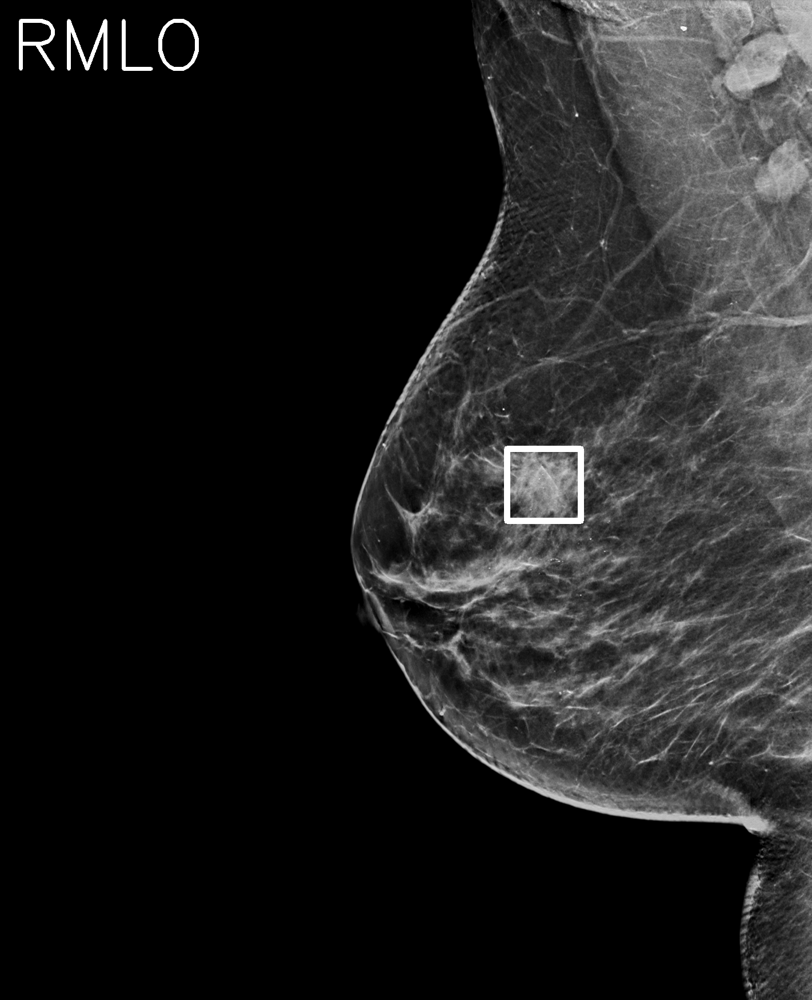

 Single Image 01:


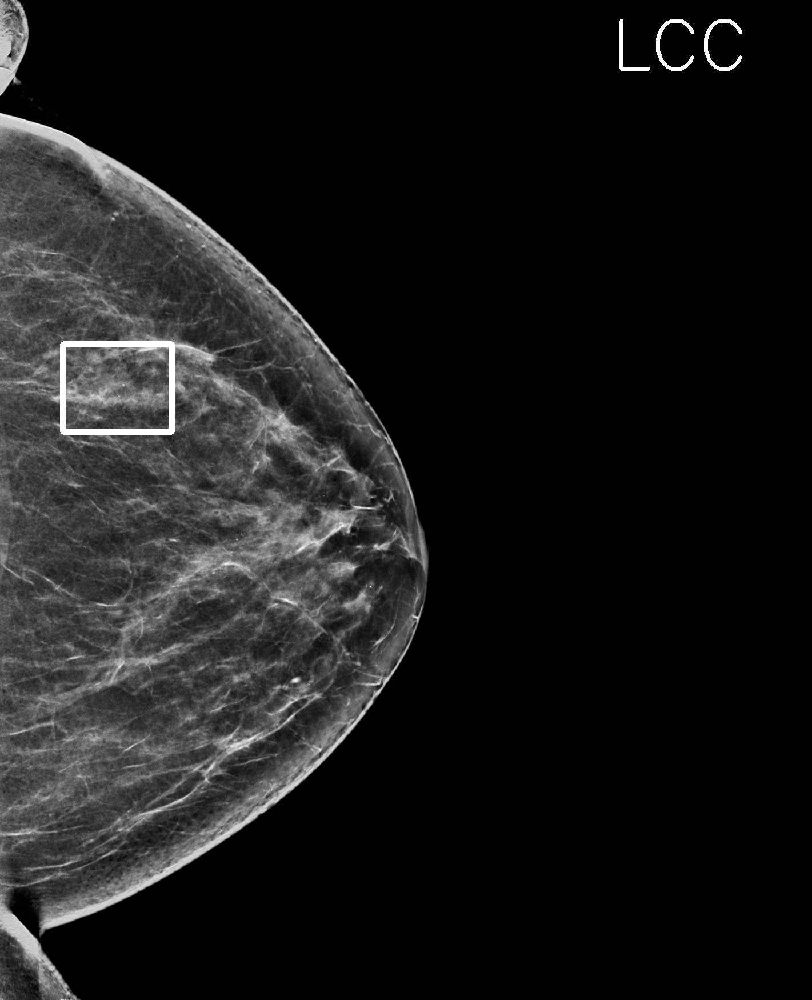

 Single Image 02:


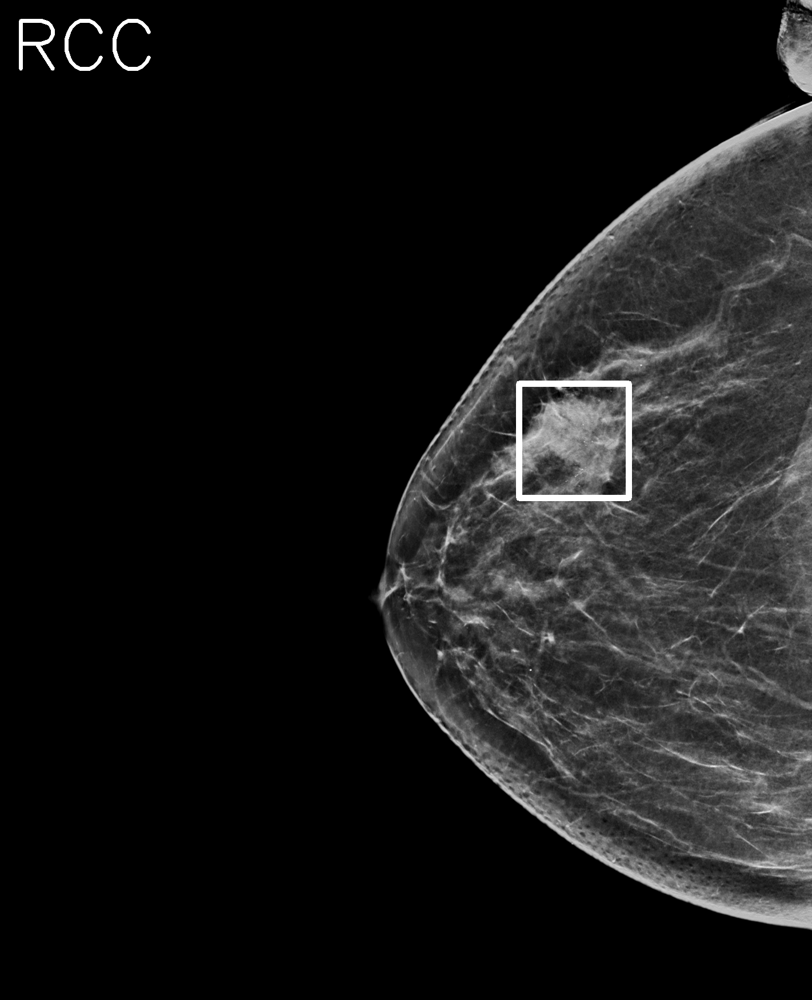

 Single Image 03:


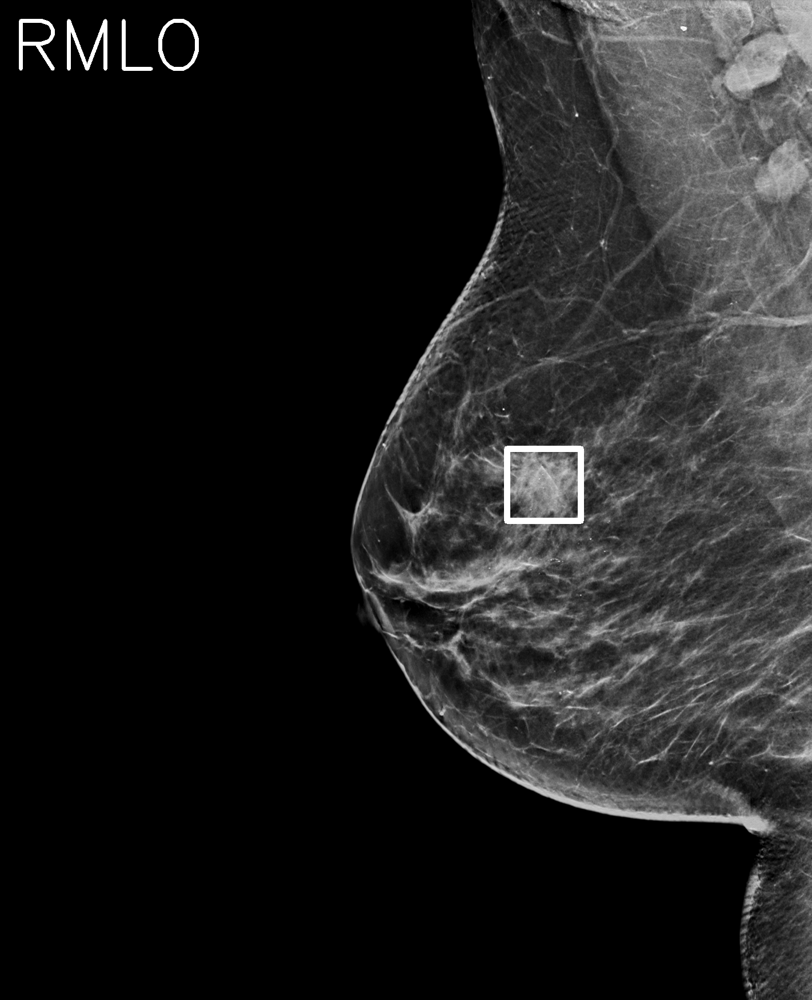

 Single Image 04:


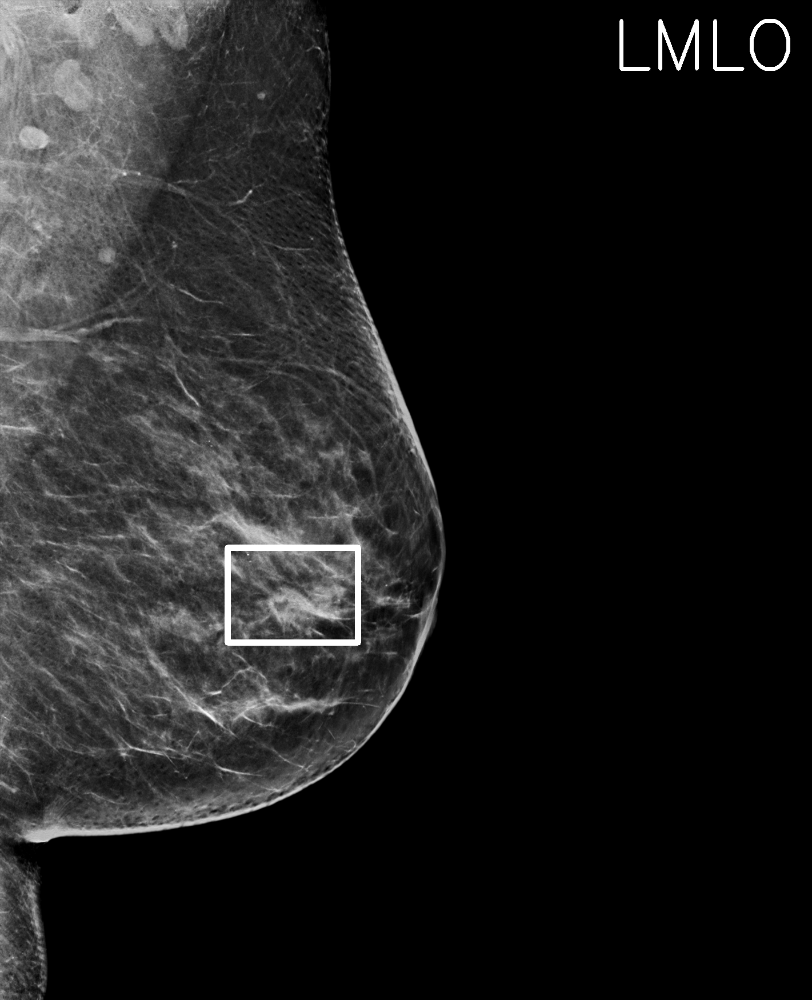

In [7]:
# Display Combined and Single Images using PIL
from PIL import Image
from IPython.display import display

# Paths to images
combined_img = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/combined/combined/DH_qa_mmaligImage_2.25.3749579399667658302878752128209802123.png"
single_imgs = [
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single01.2/01/DH_qa_mmaligImage_2.25.3749579399667658302878752128209802123.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single02/02/DH_qa_mmaligImage_2.25.3749579399667658302878752128209802123.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single3/03/DH_qa_mmaligImage_2.25.3749579399667658302878752128209802123.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP1/OUT/single4/04/DH_qa_mmaligImage_2.25.3749579399667658302878752128209802123.png"
]

print(" Combined Result Image:")
display(Image.open(combined_img))

for i, img_path in enumerate(single_imgs, 1):
    print(f" Single Image {i:02d}:")
    display(Image.open(img_path))


# Combined vs Single Run Comparison  
### Experiment: `TEST04292025_MULTISTUDY_EXP2`  
### Study ID: `2.25.325053993887667910876961132768659500389`

### Key Findings:

- All **per-DICOM scores are consistent** between the combined and single runs.
- The **Combined L score (0.8956)** is exactly the **average** of the L scores from `single/01` (0.9458) and `single/04` (0.8455):

In [1]:
#Import Required Libraries
import os
import json


In [2]:
# Base directory for current test run
BASE_DIR = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT"

# Combined JSON
COMBINED_JSON = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/combined/combined/results_full.json"

# Single run JSONs
SINGLE_01 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single/01/results_full.json"
SINGLE_02 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single2/02/results_full.json"
SINGLE_03 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single3/03/results_full.json"
SINGLE_04 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single4/04/results_full.json"


In [3]:
# Load combined run JSON
with open(COMBINED_JSON, "r") as f:
    combined_data = json.load(f)

print(" Combined JSON loaded")


 Combined JSON loaded


In [4]:
# Load all 4 single JSONs
with open(SINGLE_01, "r") as f: single_01 = json.load(f)
with open(SINGLE_02, "r") as f: single_02 = json.load(f)
with open(SINGLE_03, "r") as f: single_03 = json.load(f)
with open(SINGLE_04, "r") as f: single_04 = json.load(f)

# Group into a list
single_data = [single_01, single_02, single_03, single_04]
print(" Single JSONs loaded")


 Single JSONs loaded


In [9]:
# Combined scores
combined_total = combined_data["results"]["study_results"]["total"]["score"]
combined_L = combined_data["results"]["study_results"].get("L", {}).get("score")
combined_R = combined_data["results"]["study_results"].get("R", {}).get("score")

# Single scores from each subfolder
single_01_study = single_data[0]["results"]["study_results"]
single_02_study = single_data[1]["results"]["study_results"]
single_03_study = single_data[2]["results"]["study_results"]
single_04_study = single_data[3]["results"]["study_results"]

# Build rows
rows = [
    {"Run": "Combined", "Total": combined_total, "L": combined_L, "R": combined_R},
    {"Run": "single/01", "Total": single_01_study.get("total", {}).get("score"), "L": single_01_study.get("L", {}).get("score"), "R": single_01_study.get("R", {}).get("score")},
    {"Run": "single/02", "Total": single_02_study.get("total", {}).get("score"), "L": single_02_study.get("L", {}).get("score"), "R": single_02_study.get("R", {}).get("score")},
    {"Run": "single/03", "Total": single_03_study.get("total", {}).get("score"), "L": single_03_study.get("L", {}).get("score"), "R": single_03_study.get("R", {}).get("score")},
    {"Run": "single/04", "Total": single_04_study.get("total", {}).get("score"), "L": single_04_study.get("L", {}).get("score"), "R": single_04_study.get("R", {}).get("score")},
]

# Display as DataFrame
import pandas as pd
df_study_scores = pd.DataFrame(rows).round(4)
df_study_scores


,Run,Total,L,R
0,Combined,0.8956,0.8956,0.1528
1,single/01,0.9458,0.9458,NaN
2,single/02,0.1768,NaN,0.1768
3,single/03,0.1288,NaN,0.1288
4,single/04,0.8455,0.8455,NaN


In [8]:
# Extract Combined DICOM scores
combined_dicom = combined_data["results"]["dicom_results"]
rows = []

# Loop through each DICOM ID in combined
for dxm_id, results in combined_dicom.items():
    comb_score = max(d["score"] for d in results.get("none", []))
    
    # Look for match in single subfolders
    single_score = None
    matching_folder = None
    for i, entry in enumerate(single_data):
        dicom_results = entry["results"]["dicom_results"]
        if dxm_id in dicom_results:
            single_score = max(d["score"] for d in dicom_results[dxm_id].get("none", []))
            matching_folder = f"single/0{i+1}"
            break
    
    delta = comb_score - single_score if single_score is not None else None
    rows.append({
        "DICOM ID": dxm_id,
        "Combined Score": round(comb_score, 4),
        "Single Run": matching_folder,
        "Single Score": round(single_score, 4) if single_score else None,
        "Δ (Combined − Single)": round(delta, 4) if delta else None
    })

# Display table
df_dicom_comparison = pd.DataFrame(rows)
df_dicom_comparison


,DICOM ID,Combined Score,Single Run,Single Score,Δ (Combined − Single)
0,2.25.207787770382434824674513424952652045445,0.1288,single/03,0.1288,None
1,2.25.110841102649971267817558469858804139000,0.9458,single/01,0.9458,None
2,2.25.333978127709834624282286247753349209371,0.8455,single/04,0.8455,None
3,2.25.154425783010897696777967601107595851744,0.1768,single/02,0.1768,None


 Combined Result Image:


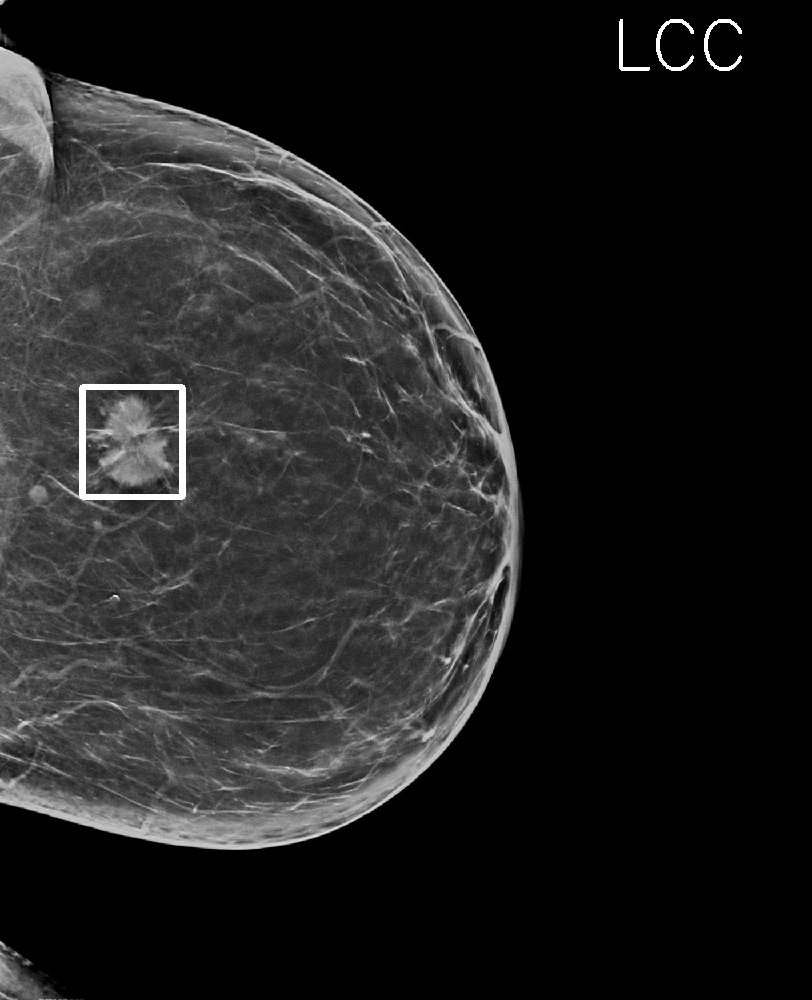

 Single Image 01:


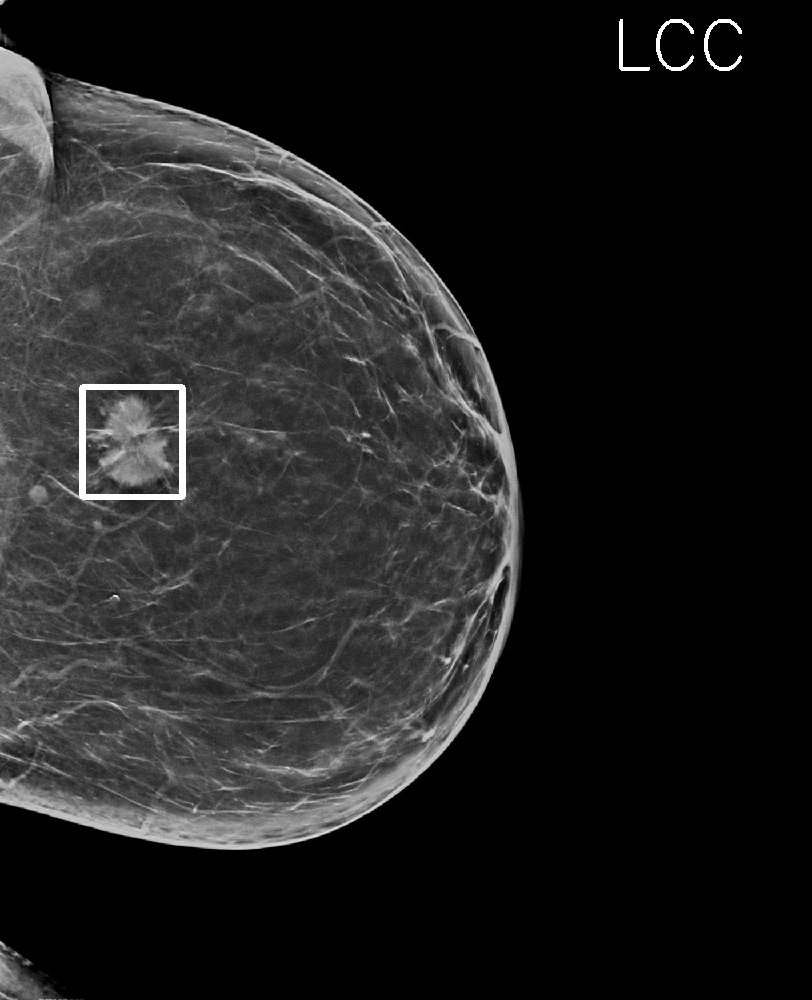

 Single Image 02:


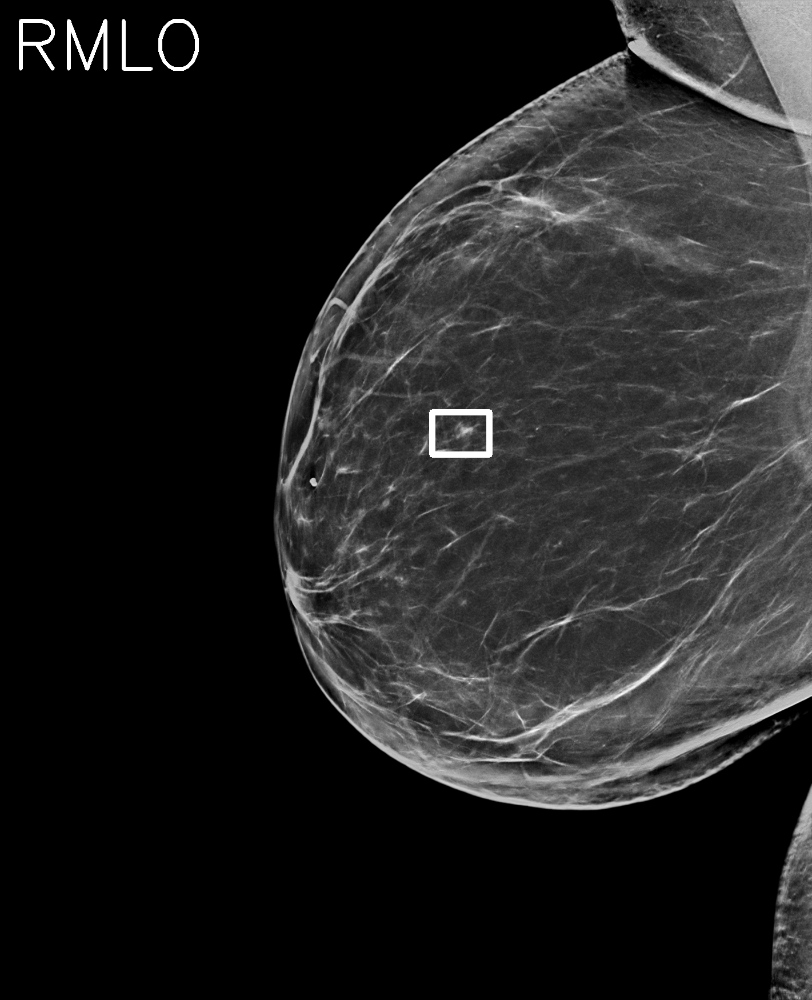

 Single Image 03:


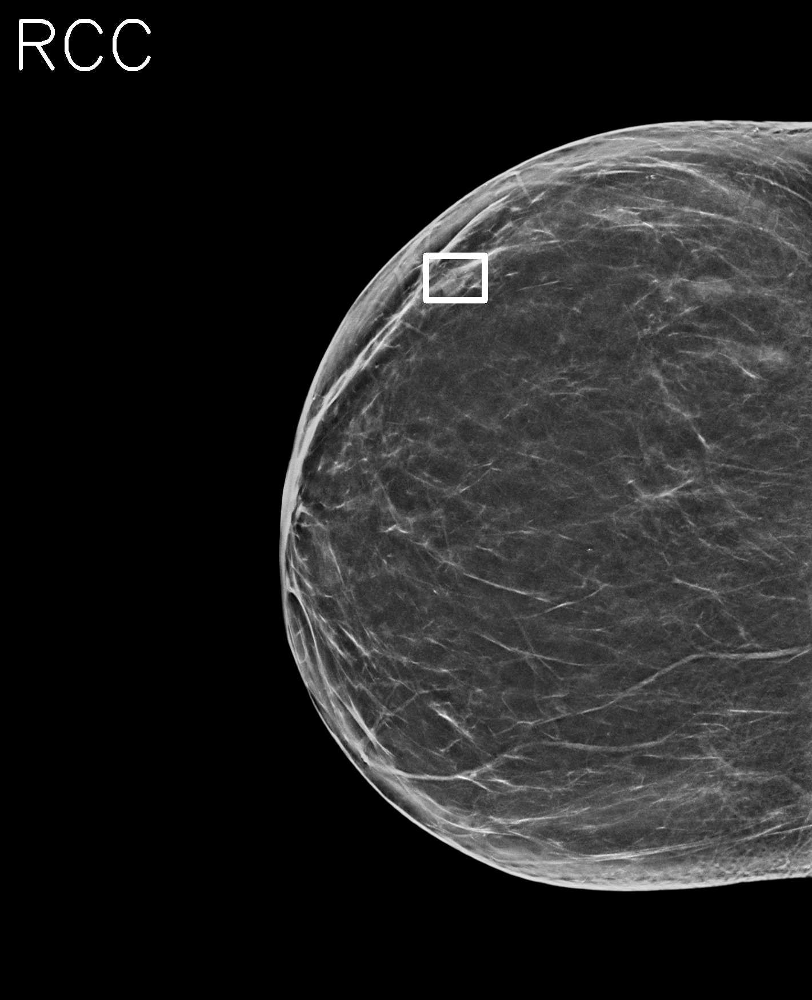

 Single Image 04:


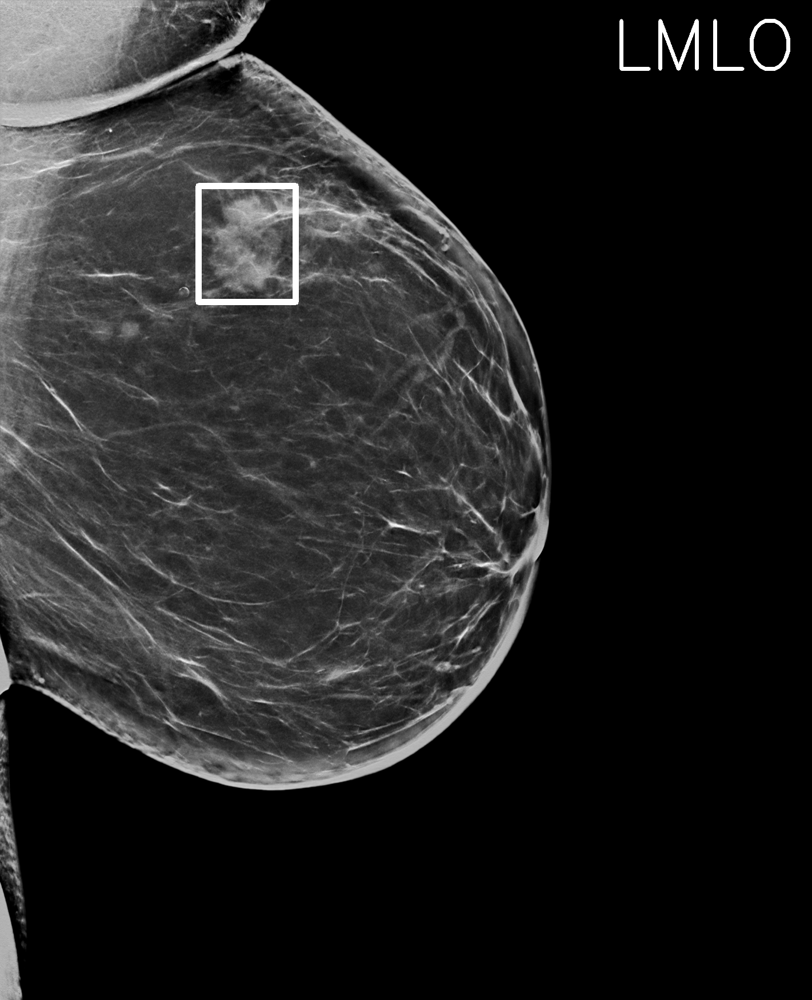

In [10]:
# Display Combined and Single Images using PIL
from PIL import Image
from IPython.display import display

# Paths to images
combined_img = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/combined/combined/DH_qa_mmaligImage_2.25.325053993887667910876961132768659500389.png"
single_imgs = [
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single/01/DH_qa_mmaligImage_2.25.325053993887667910876961132768659500389.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single2/02/DH_qa_mmaligImage_2.25.325053993887667910876961132768659500389.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single3/03/DH_qa_mmaligImage_2.25.325053993887667910876961132768659500389.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP2/OUT/single4/04/DH_qa_mmaligImage_2.25.325053993887667910876961132768659500389.png"
]

print(" Combined Result Image:")
display(Image.open(combined_img))

for i, img_path in enumerate(single_imgs, 1):
    print(f" Single Image {i:02d}:")
    display(Image.open(img_path))


# Combined vs Single Run Comparison  
### Experiment: `TEST04292025_MULTISTUDY_EXP3`  
### Study ID: `2.25.66196742260149436161146913576006547230`



### Key Findings:

- All **DICOM scores** between the combined and single runs are consistent.
- The **Combined L score (0.1488)** is the **average** of L scores from `single/01` (0.2529) and `single/04` (0.0447):



In [11]:
#Import Required Libraries
import os
import json


In [12]:
# Base directory for current test run
BASE_DIR = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT"

# Combined JSON
COMBINED_JSON = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/combined/combined/results_full.json"

# Single run JSONs
SINGLE_01 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single/01/results_full.json"
SINGLE_02 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single2/02/results_full.json"
SINGLE_03 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single3/03/results_full.json"
SINGLE_04 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single4/04/results_full.json"


In [13]:
# Load combined run JSON
with open(COMBINED_JSON, "r") as f:
    combined_data = json.load(f)

print(" Combined JSON loaded")


 Combined JSON loaded


In [14]:
# Load all 4 single JSONs
with open(SINGLE_01, "r") as f: single_01 = json.load(f)
with open(SINGLE_02, "r") as f: single_02 = json.load(f)
with open(SINGLE_03, "r") as f: single_03 = json.load(f)
with open(SINGLE_04, "r") as f: single_04 = json.load(f)

# Group into a list
single_data = [single_01, single_02, single_03, single_04]
print(" Single JSONs loaded")


 Single JSONs loaded


In [15]:
# Combined scores
combined_total = combined_data["results"]["study_results"]["total"]["score"]
combined_L = combined_data["results"]["study_results"].get("L", {}).get("score")
combined_R = combined_data["results"]["study_results"].get("R", {}).get("score")

# Single scores from each subfolder
single_01_study = single_data[0]["results"]["study_results"]
single_02_study = single_data[1]["results"]["study_results"]
single_03_study = single_data[2]["results"]["study_results"]
single_04_study = single_data[3]["results"]["study_results"]

# Build rows
import pandas as pd
rows = [
    {"Run": "Combined", "Total": combined_total, "L": combined_L, "R": combined_R},
    {"Run": "single/01", "Total": single_01_study.get("total", {}).get("score"), "L": single_01_study.get("L", {}).get("score"), "R": single_01_study.get("R", {}).get("score")},
    {"Run": "single/02", "Total": single_02_study.get("total", {}).get("score"), "L": single_02_study.get("L", {}).get("score"), "R": single_02_study.get("R", {}).get("score")},
    {"Run": "single/03", "Total": single_03_study.get("total", {}).get("score"), "L": single_03_study.get("L", {}).get("score"), "R": single_03_study.get("R", {}).get("score")},
    {"Run": "single/04", "Total": single_04_study.get("total", {}).get("score"), "L": single_04_study.get("L", {}).get("score"), "R": single_04_study.get("R", {}).get("score")},
]

# Display as DataFrame
df_study_scores = pd.DataFrame(rows).round(4)
df_study_scores


,Run,Total,L,R
0,Combined,0.7608,0.1488,0.7608
1,single/01,0.2529,0.2529,NaN
2,single/02,0.7223,NaN,0.7223
3,single/03,0.7992,NaN,0.7992
4,single/04,0.0447,0.0447,NaN


In [16]:
# Extract Combined DICOM scores
combined_dicom = combined_data["results"]["dicom_results"]
rows = []

# Loop through each DICOM ID in combined
for dxm_id, results in combined_dicom.items():
    comb_score = max(d["score"] for d in results.get("none", []))
    
    # Look for match in single subfolders
    single_score = None
    matching_folder = None
    for i, entry in enumerate(single_data):
        dicom_results = entry["results"]["dicom_results"]
        if dxm_id in dicom_results:
            single_score = max(d["score"] for d in dicom_results[dxm_id].get("none", []))
            matching_folder = f"single/0{i+1}"
            break
    
    delta = comb_score - single_score if single_score is not None else None
    rows.append({
        "DICOM ID": dxm_id,
        "Combined Score": round(comb_score, 4),
        "Single Run": matching_folder,
        "Single Score": round(single_score, 4) if single_score else None,
        "Δ (Combined − Single)": round(delta, 4) if delta else None
    })

# Display table
df_dicom_comparison = pd.DataFrame(rows)
df_dicom_comparison


,DICOM ID,Combined Score,Single Run,Single Score,Δ (Combined − Single)
0,2.25.215733174365933813950331705069469628125,0.7223,single/02,0.7223,None
1,2.25.84965361106982841240403135234187511802,0.0447,single/04,0.0447,None
2,2.25.329228010123760120062824620853526709468,0.7992,single/03,0.7992,None
3,2.25.211863001091326531084374172049523634377,0.2529,single/01,0.2529,None


 Combined Result Image:


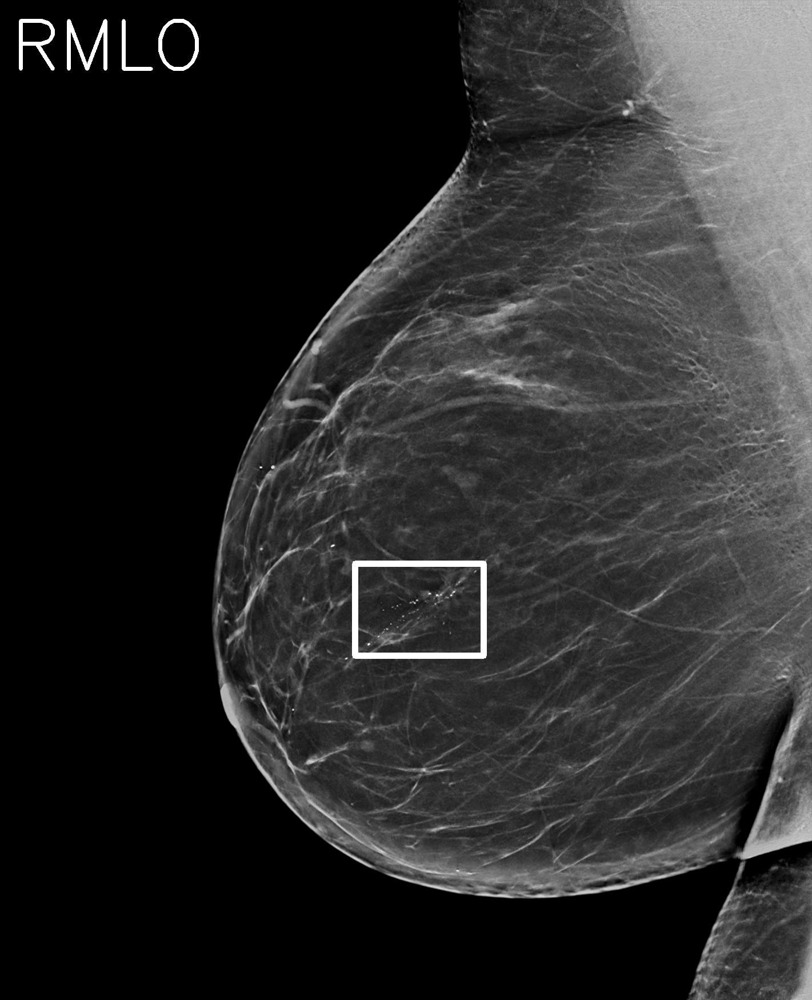

 Single Image 01:


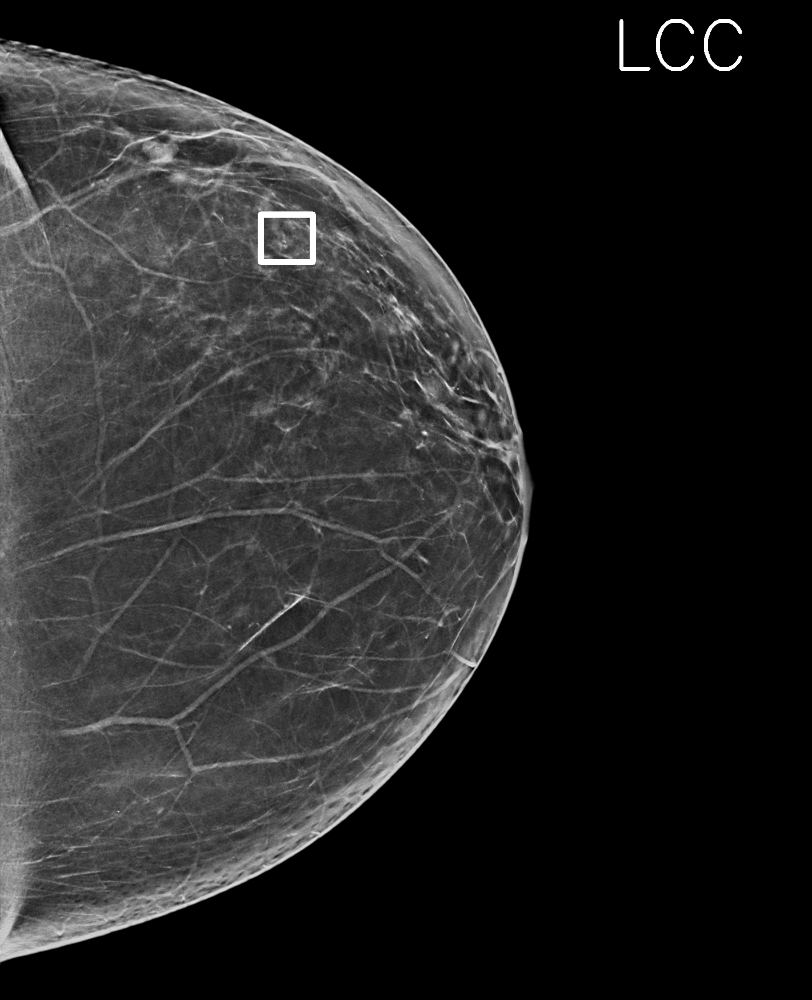

 Single Image 02:


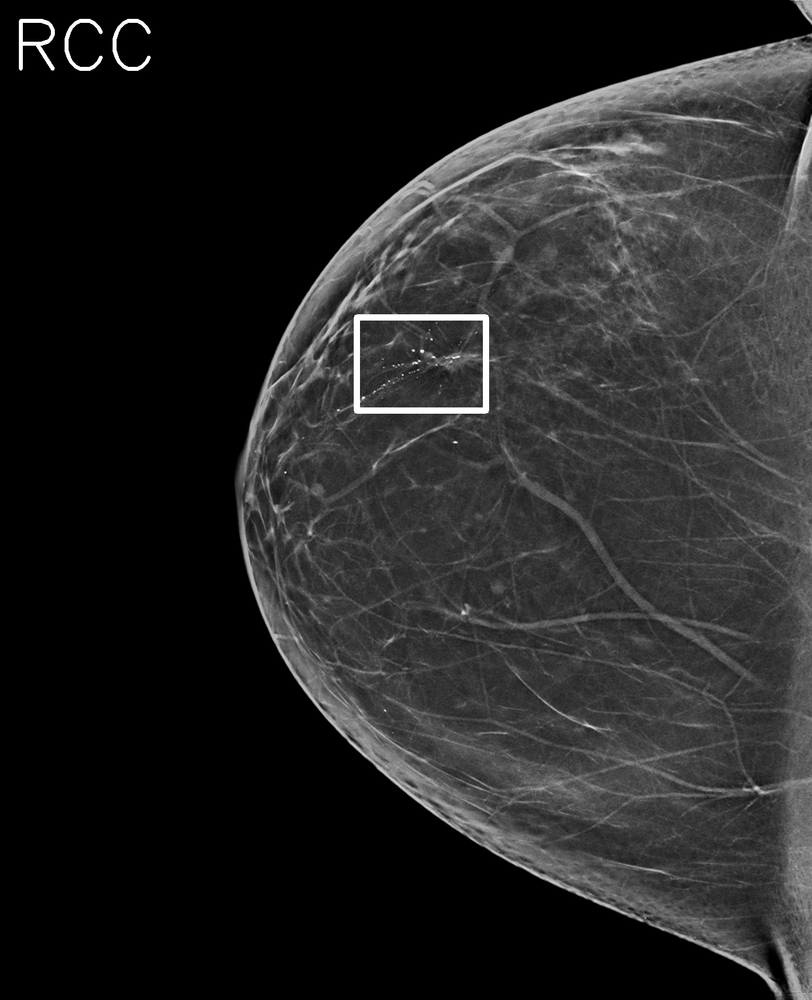

 Single Image 03:


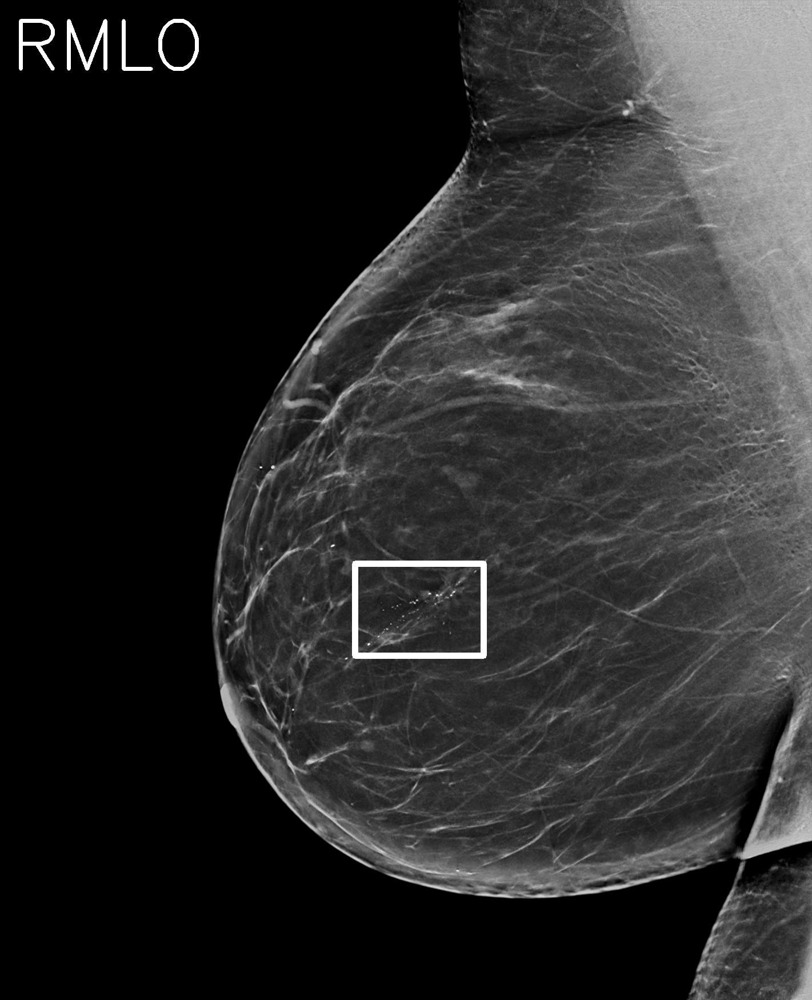

 Single Image 04:


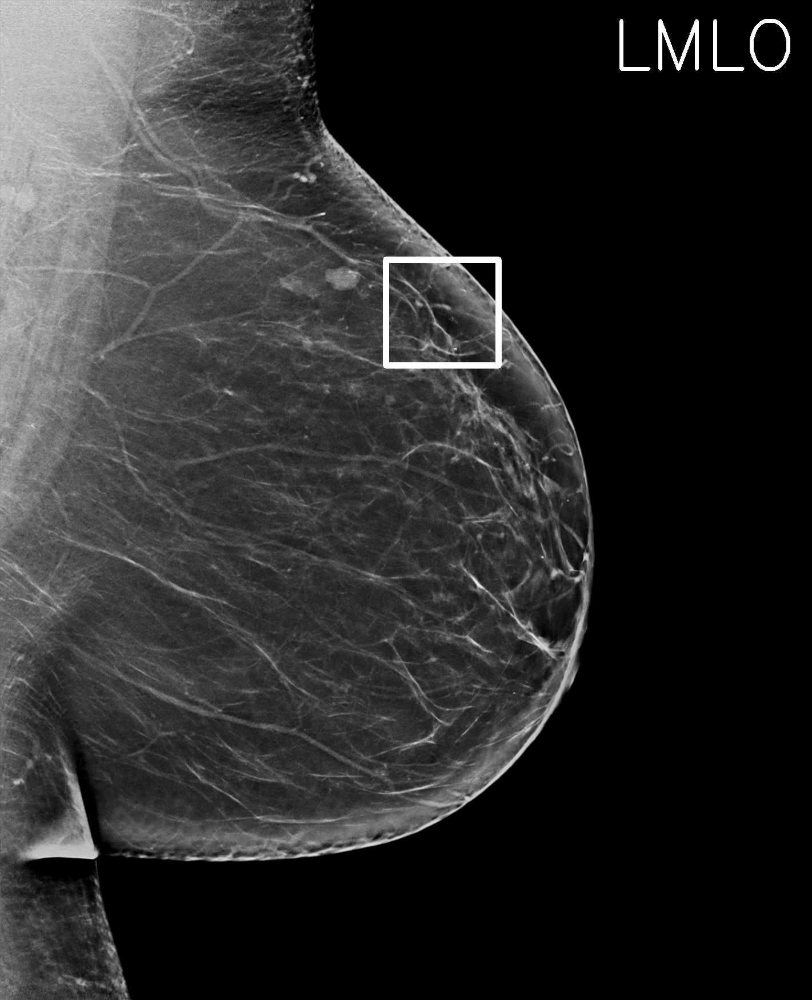

In [17]:
# Display Combined and Single Images using PIL
from PIL import Image
from IPython.display import display

# Paths to images
combined_img = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/combined/combined/DH_qa_mmaligImage_2.25.66196742260149436161146913576006547230.png"
single_imgs = [
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single/01/DH_qa_mmaligImage_2.25.66196742260149436161146913576006547230.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single2/02/DH_qa_mmaligImage_2.25.66196742260149436161146913576006547230.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single3/03/DH_qa_mmaligImage_2.25.66196742260149436161146913576006547230.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04292025_MULTISTUDY_EXP3/OUT/single4/04/DH_qa_mmaligImage_2.25.66196742260149436161146913576006547230.png"
]

print(" Combined Result Image:")
display(Image.open(combined_img))

for i, img_path in enumerate(single_imgs, 1):
    print(f" Single Image {i:02d}:")
    display(Image.open(img_path))


# Combined vs Single Run Comparison  
### Experiment: `TEST04272025_MULTISTUDY_EXP4`  
### Study ID: `2.25.115834651935973436478482234743002115261`



### Key Findings:

- **Combined L Score = 0.4845**, which is the average of L scores from `single/01` (0.8663) and `single/02` (0.1026):



In [1]:
# Import Required Libraries
import os
import json


In [2]:
# Base directory for current test run
BASE_DIR = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT"

# Combined JSON
COMBINED_JSON = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/combined/combined/results_full.json"

# Single run JSONs
SINGLE_01 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single/01/results_full.json"
SINGLE_02 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single2/02/results_full.json"
SINGLE_03 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single3/03/results_full.json"
SINGLE_04 = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single4/04/results_full.json"


In [3]:
# Load combined run JSON
with open(COMBINED_JSON, "r") as f:
    combined_data = json.load(f)

print(" Combined JSON loaded")


 Combined JSON loaded


In [4]:
# Load all 4 single JSONs
with open(SINGLE_01, "r") as f: single_01 = json.load(f)
with open(SINGLE_02, "r") as f: single_02 = json.load(f)
with open(SINGLE_03, "r") as f: single_03 = json.load(f)
with open(SINGLE_04, "r") as f: single_04 = json.load(f)

# Group into a list
single_data = [single_01, single_02, single_03, single_04]
print(" Single JSONs loaded")


 Single JSONs loaded


In [5]:
# Combined scores
combined_total = combined_data["results"]["study_results"]["total"]["score"]
combined_L = combined_data["results"]["study_results"].get("L", {}).get("score")
combined_R = combined_data["results"]["study_results"].get("R", {}).get("score")

# Single scores from each subfolder
single_01_study = single_data[0]["results"]["study_results"]
single_02_study = single_data[1]["results"]["study_results"]
single_03_study = single_data[2]["results"]["study_results"]
single_04_study = single_data[3]["results"]["study_results"]

# Build rows
import pandas as pd
rows = [
    {"Run": "Combined", "Total": combined_total, "L": combined_L, "R": combined_R},
    {"Run": "single/01", "Total": single_01_study.get("total", {}).get("score"), "L": single_01_study.get("L", {}).get("score"), "R": single_01_study.get("R", {}).get("score")},
    {"Run": "single/02", "Total": single_02_study.get("total", {}).get("score"), "L": single_02_study.get("L", {}).get("score"), "R": single_02_study.get("R", {}).get("score")},
    {"Run": "single/03", "Total": single_03_study.get("total", {}).get("score"), "L": single_03_study.get("L", {}).get("score"), "R": single_03_study.get("R", {}).get("score")},
    {"Run": "single/04", "Total": single_04_study.get("total", {}).get("score"), "L": single_04_study.get("L", {}).get("score"), "R": single_04_study.get("R", {}).get("score")},
]

# Display as DataFrame
df_study_scores = pd.DataFrame(rows).round(4)
df_study_scores


,Run,Total,L,R
0,Combined,0.4845,0.4845,0.1477
1,single/01,0.8663,0.8663,NaN
2,single/02,0.1026,0.1026,NaN
3,single/03,0.1698,NaN,0.1698
4,single/04,0.1255,NaN,0.1255


In [6]:
# Extract Combined DICOM scores
combined_dicom = combined_data["results"]["dicom_results"]
rows = []

# Loop through each DICOM ID in combined
for dxm_id, results in combined_dicom.items():
    comb_score = max(d["score"] for d in results.get("none", []))
    
    # Look for match in single subfolders
    single_score = None
    matching_folder = None
    for i, entry in enumerate(single_data):
        dicom_results = entry["results"]["dicom_results"]
        if dxm_id in dicom_results:
            single_score = max(d["score"] for d in dicom_results[dxm_id].get("none", []))
            matching_folder = f"single/0{i+1}"
            break
    
    delta = comb_score - single_score if single_score is not None else None
    rows.append({
        "DICOM ID": dxm_id,
        "Combined Score": round(comb_score, 4),
        "Single Run": matching_folder,
        "Single Score": round(single_score, 4) if single_score else None,
        "Δ (Combined − Single)": round(delta, 4) if delta else None
    })

# Display table
df_dicom_comparison = pd.DataFrame(rows)
df_dicom_comparison


,DICOM ID,Combined Score,Single Run,Single Score,Δ (Combined − Single)
0,2.25.230501440820622852995574322032559566964,0.1026,single/02,0.1026,None
1,2.25.219698310829579759837040354291823154167,0.8663,single/01,0.8663,None
2,2.25.245848567005133371729787669316461293218,0.1698,single/03,0.1698,None
3,2.25.50284884291466404296288666613508968870,0.1255,single/04,0.1255,None


 Combined Result Image:


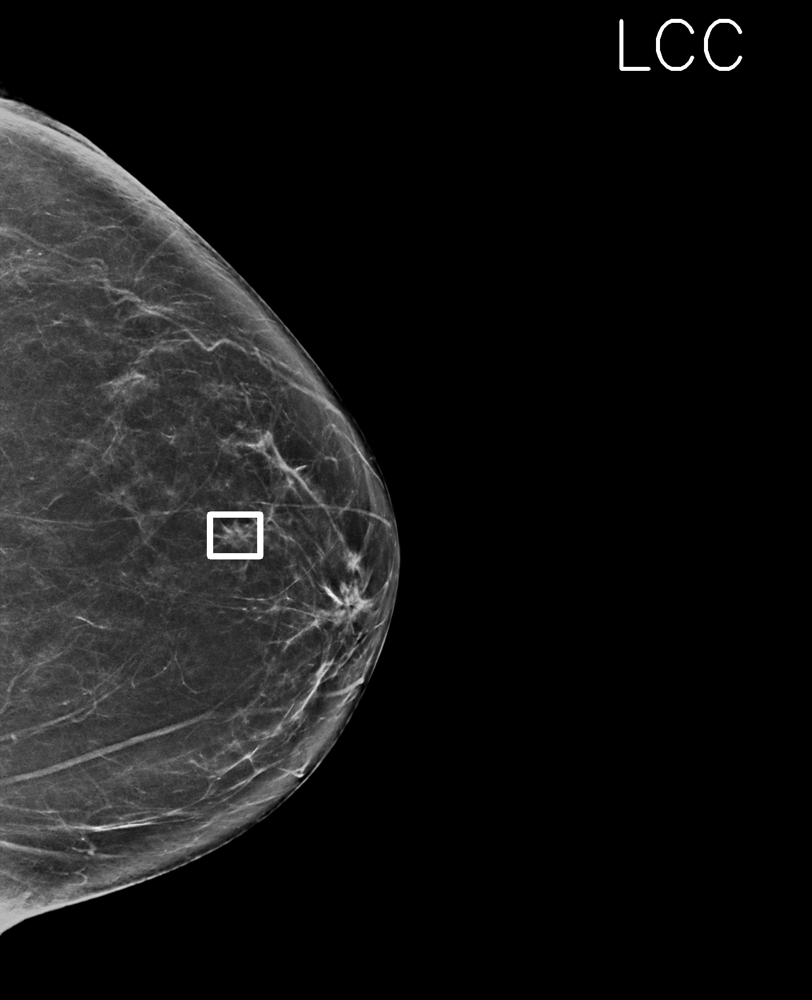

 Single Image 01:


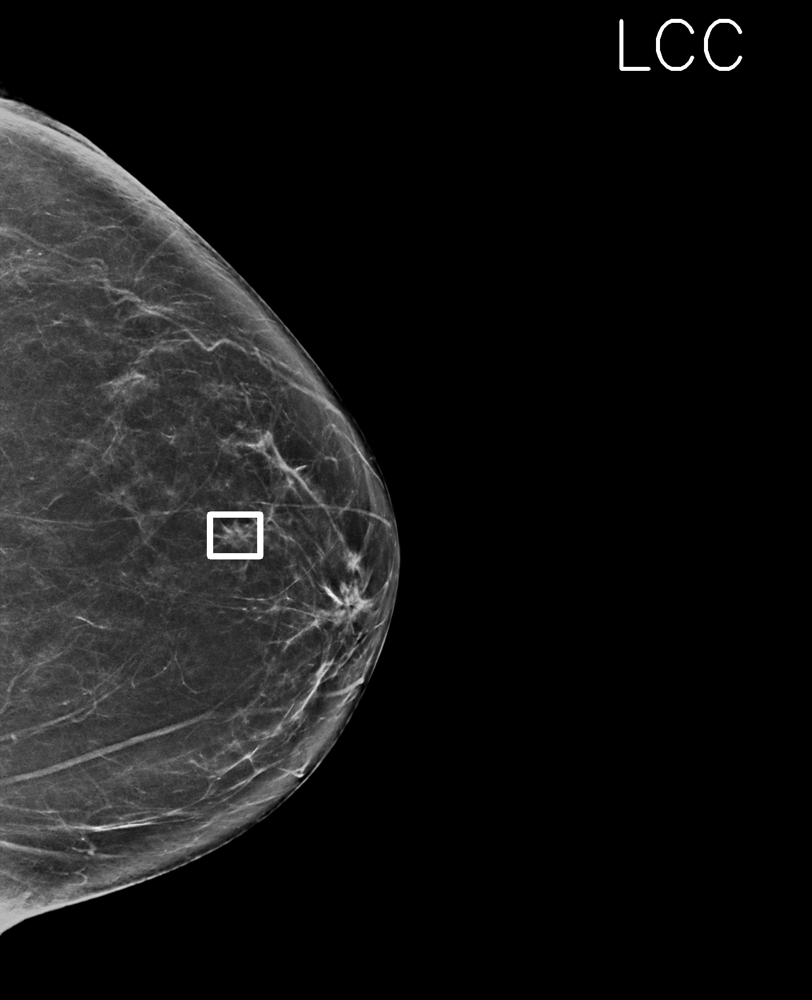

 Single Image 02:


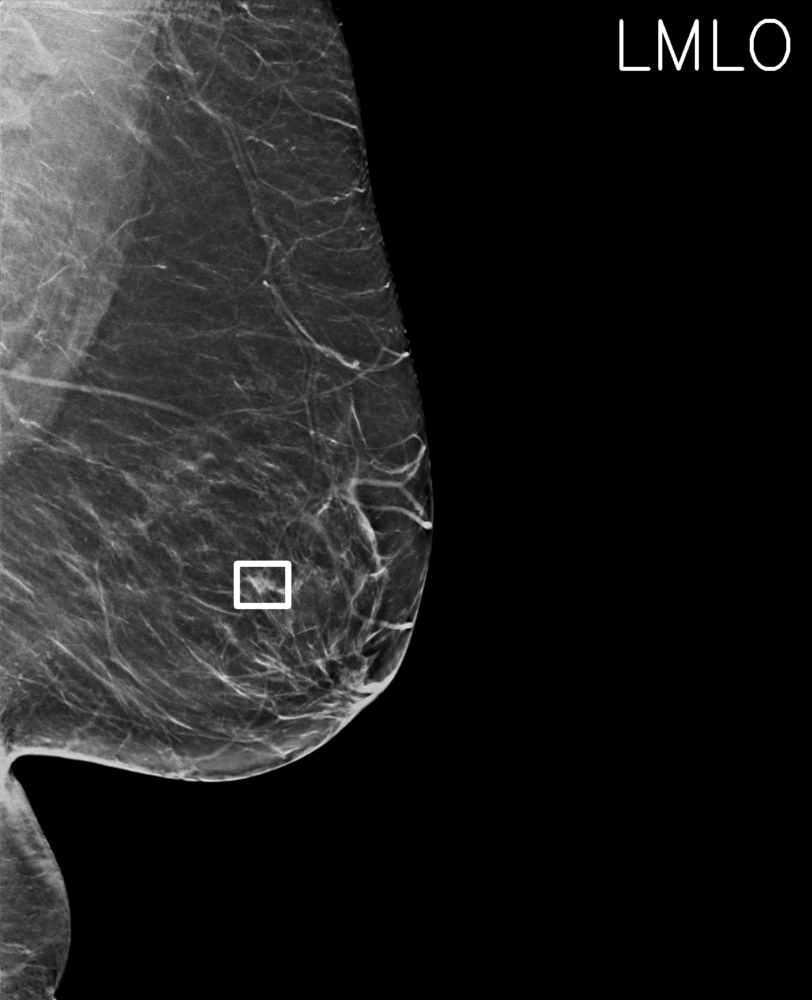

 Single Image 03:


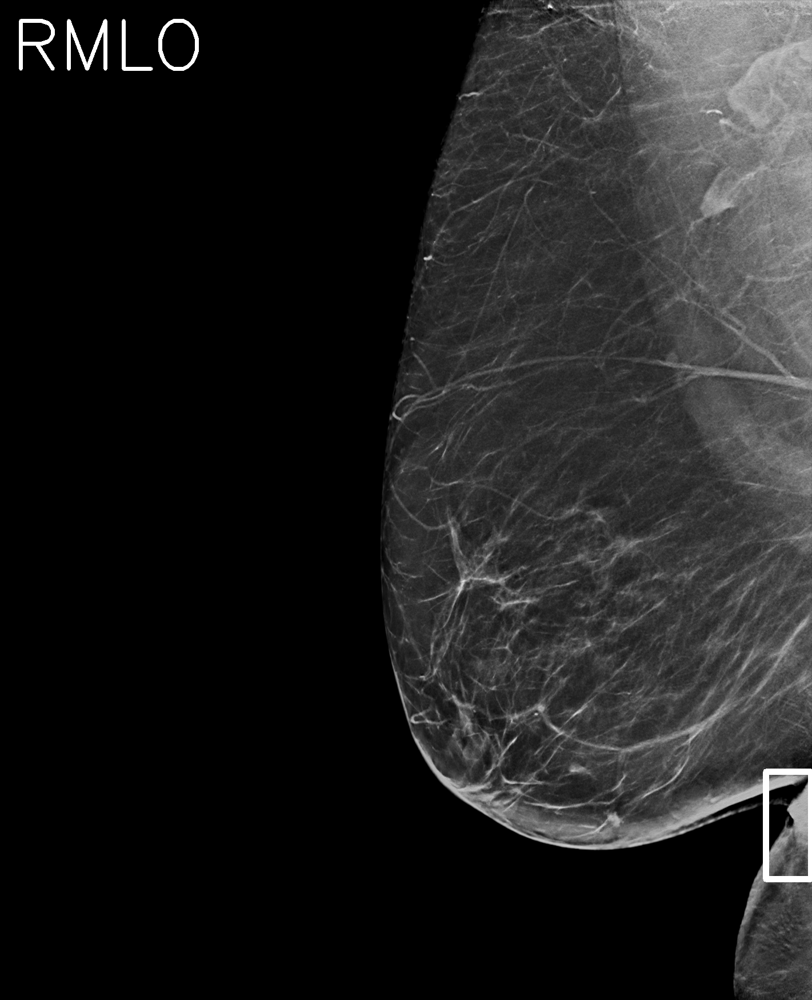

 Single Image 04:


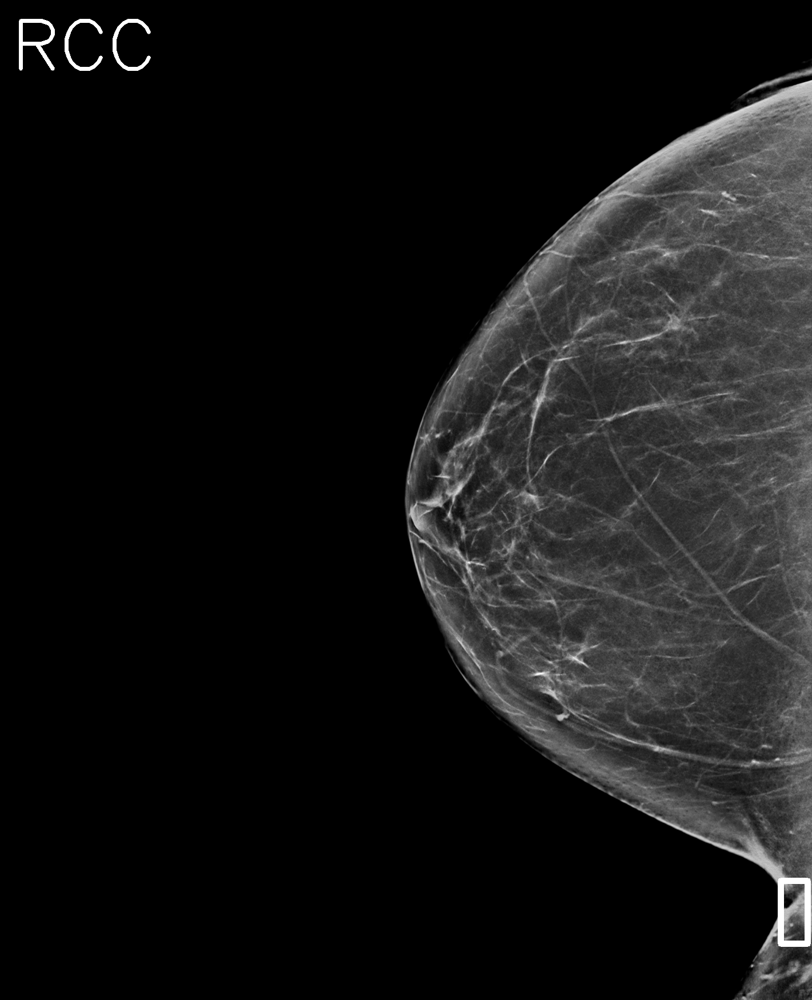

In [7]:
# Display Combined and Single Images using PIL
from PIL import Image
from IPython.display import display

# Paths to images
combined_img = "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/combined/combined/DH_qa_mmaligImage_2.25.115834651935973436478482234743002115261.png"
single_imgs = [
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single/01/DH_qa_mmaligImage_2.25.115834651935973436478482234743002115261.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single2/02/DH_qa_mmaligImage_2.25.115834651935973436478482234743002115261.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single3/03/DH_qa_mmaligImage_2.25.115834651935973436478482234743002115261.png",
    "/raid/mpsych/OMAMA/2025/PLAYGROUND/TEST04272025_MULTISTUDY_EXP4/OUT/single4/04/DH_qa_mmaligImage_2.25.115834651935973436478482234743002115261.png"
]

print(" Combined Result Image:")
display(Image.open(combined_img))

for i, img_path in enumerate(single_imgs, 1):
    print(f" Single Image {i:02d}:")
    display(Image.open(img_path))
